<h1><center>Mechanisms of Action (MoA) Prediction. Data analysis and visualization</center></h1>

<center><img src="https://pharmacyinnovations.net/wp-content/uploads/pillsdrugs.png"></center>


<div class="list-group" id="list-tab" role="tablist">
<h2 class="list-group-item list-group-item-action active" data-toggle="list" style='background:blue; border:0; color:white' role="tab" aria-controls="home"><center>Quick navigation</center></h2>

* [1. Basic Data Overview](#1)
* [2. Categories visualization](#2)
* [3. Gene and cell features distribution](#3)
* [4. Training features correlation](#4)
* [5. Targets analysis](#5)
* [6. Train & Targets correlations](#6)
* [7. Targets & Train features dependecies](#7)
    
#### I also started second <a href="https://www.kaggle.com/isaienkov/moa-prediction-interesting-findings/">kernel</a> where I will incrementally add interesting finding extracted from this dataset.

In [1]:
import numpy as np
import pandas as pd
import plotly.express as px
from IPython.display import display
import random
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import time

pd.options.display.max_columns = None

<a id="1"></a>
<h2 style='background:blue; border:0; color:white'><center>1. Basic Data Overview</center><h2>

In [2]:
train = pd.read_csv('/kaggle/input/lish-moa/train_features.csv')
test = pd.read_csv('/kaggle/input/lish-moa/test_features.csv')

train['dataset'] = 'train'
test['dataset'] = 'test'

df = pd.concat([train, test])

Take a look into training and test sets.

In [3]:
train.head()

,sig_id,cp_type,cp_time,cp_dose,g-0,g-1,g-2,g-3,g-4,g-5,g-6,g-7,g-8,g-9,g-10,g-11,g-12,g-13,g-14,g-15,g-16,g-17,g-18,g-19,g-20,g-21,g-22,g-23,g-24,g-25,g-26,g-27,g-28,g-29,g-30,g-31,g-32,g-33,g-34,g-35,g-36,g-37,g-38,g-39,g-40,g-41,g-42,g-43,g-44,g-45,g-46,g-47,g-48,g-49,g-50,g-51,g-52,g-53,g-54,g-55,g-56,g-57,g-58,g-59,g-60,g-61,g-62,g-63,g-64,g-65,g-66,g-67,g-68,g-69,g-70,g-71,g-72,g-73,g-74,g-75,g-76,g-77,g-78,g-79,g-80,g-81,g-82,g-83,g-84,g-85,g-86,g-87,g-88,g-89,g-90,g-91,g-92,g-93,g-94,g-95,g-96,g-97,g-98,g-99,g-100,g-101,g-102,g-103,g-104,g-105,g-106,g-107,g-108,g-109,g-110,g-111,g-112,g-113,g-114,g-115,g-116,g-117,g-118,g-119,g-120,g-121,g-122,g-123,g-124,g-125,g-126,g-127,g-128,g-129,g-130,g-131,g-132,g-133,g-134,g-135,g-136,g-137,g-138,g-139,g-140,g-141,g-142,g-143,g-144,g-145,g-146,g-147,g-148,g-149,g-150,g-151,g-152,g-153,g-154,g-155,g-156,g-157,g-158,g-159,g-160,g-161,g-162,g-163,g-164,g-165,g-166,g-167,g-168,g-169,g-170,g-171,g-172,g-173,g-174,g-175,g-176,g-177,g-178,g-179,g-180,g-181,g-182,g-183,g-184,g-185,g-186,g-187,g-188,g-189,g-190,g-191,g-192,g-193,g-194,g-195,g-196,g-197,g-198,g-199,g-200,g-201,g-202,g-203,g-204,g-205,g-206,g-207,g-208,g-209,g-210,g-211,g-212,g-213,g-214,g-215,g-216,g-217,g-218,g-219,g-220,g-221,g-222,g-223,g-224,g-225,g-226,g-227,g-228,g-229,g-230,g-231,g-232,g-233,g-234,g-235,g-236,g-237,g-238,g-239,g-240,g-241,g-242,g-243,g-244,g-245,g-246,g-247,g-248,g-249,g-250,g-251,g-252,g-253,g-254,g-255,g-256,g-257,g-258,g-259,g-260,g-261,g-262,g-263,g-264,g-265,g-266,g-267,g-268,g-269,g-270,g-271,g-272,g-273,g-274,g-275,g-276,g-277,g-278,g-279,g-280,g-281,g-282,g-283,g-284,g-285,g-286,g-287,g-288,g-289,g-290,g-291,g-292,g-293,g-294,g-295,g-296,g-297,g-298,g-299,g-300,g-301,g-302,g-303,g-304,g-305,g-306,g-307,g-308,g-309,g-310,g-311,g-312,g-313,g-314,g-315,g-316,g-317,g-318,g-319,g-320,g-321,g-322,g-323,g-324,g-325,g-326,g-327,g-328,g-329,g-330,g-331,g-332,g-333,g-334,g-335,g-336,g-337,g-338,g-339,g-340,g-341,g-342,g-343,g-344,g-345,g-346,g-347,g-348,g-349,g-350,g-351,g-352,g-353,g-354,g-355,g-356,g-357,g-358,g-359,g-360,g-361,g-362,g-363,g-364,g-365,g-366,g-367,g-368,g-369,g-370,g-371,g-372,g-373,g-374,g-375,g-376,g-377,g-378,g-379,g-380,g-381,g-382,g-383,g-384,g-385,g-386,g-387,g-388,g-389,g-390,g-391,g-392,g-393,g-394,g-395,g-396,g-397,g-398,g-399,g-400,g-401,g-402,g-403,g-404,g-405,g-406,g-407,g-408,g-409,g-410,g-411,g-412,g-413,g-414,g-415,g-416,g-417,g-418,g-419,g-420,g-421,g-422,g-423,g-424,g-425,g-426,g-427,g-428,g-429,g-430,g-431,g-432,g-433,g-434,g-435,g-436,g-437,g-438,g-439,g-440,g-441,g-442,g-443,g-444,g-445,g-446,g-447,g-448,g-449,g-450,g-451,g-452,g-453,g-454,g-455,g-456,g-457,g-458,g-459,g-460,g-461,g-462,g-463,g-464,g-465,g-466,g-467,g-468,g-469,g-470,g-471,g-472,g-473,g-474,g-475,g-476,g-477,g-478,g-479,g-480,g-481,g-482,g-483,g-484,g-485,g-486,g-487,g-488,g-489,g-490,g-491,g-492,g-493,g-494,g-495,g-496,g-497,g-498,g-499,g-500,g-501,g-502,g-503,g-504,g-505,g-506,g-507,g-508,g-509,g-510,g-511,g-512,g-513,g-514,g-515,g-516,g-517,g-518,g-519,g-520,g-521,g-522,g-523,g-524,g-525,g-526,g-527,g-528,g-529,g-530,g-531,g-532,g-533,g-534,g-535,g-536,g-537,g-538,g-539,g-540,g-541,g-542,g-543,g-544,g-545,g-546,g-547,g-548,g-549,g-550,g-551,g-552,g-553,g-554,g-555,g-556,g-557,g-558,g-559,g-560,g-561,g-562,g-563,g-564,g-565,g-566,g-567,g-568,g-569,g-570,g-571,g-572,g-573,g-574,g-575,g-576,g-577,g-578,g-579,g-580,g-581,g-582,g-583,g-584,g-585,g-586,g-587,g-588,g-589,g-590,g-591,g-592,g-593,g-594,g-595,g-596,g-597,g-598,g-599,g-600,g-601,g-602,g-603,g-604,g-605,g-606,g-607,g-608,g-609,g-610,g-611,g-612,g-613,g-614,g-615,g-616,g-617,g-618,g-619,g-620,g-621,g-622,g-623,g-624,g-625,g-626,g-627,g-628,g-629,g-630,g-631,g-632,g-633,g-634,g-635,g-636,g-637,g-638,g-639,g-640,g-641,g-642,g-643,g-644,g-645,g-646,g-647,g-648,g-649,g-650,g-651,g-652,g-653,g-654,g-655,g-656,g-657,g-658,g-659,g-660,g-661,g-662,g-663,g-664,g-665,g-666,g-667,g-668,g-669,g-670,g-671,g-672,g-673,g-674,g-675,g-676,g-677,g-678,g-67

In [4]:
test.head()

,sig_id,cp_type,cp_time,cp_dose,g-0,g-1,g-2,g-3,g-4,g-5,g-6,g-7,g-8,g-9,g-10,g-11,g-12,g-13,g-14,g-15,g-16,g-17,g-18,g-19,g-20,g-21,g-22,g-23,g-24,g-25,g-26,g-27,g-28,g-29,g-30,g-31,g-32,g-33,g-34,g-35,g-36,g-37,g-38,g-39,g-40,g-41,g-42,g-43,g-44,g-45,g-46,g-47,g-48,g-49,g-50,g-51,g-52,g-53,g-54,g-55,g-56,g-57,g-58,g-59,g-60,g-61,g-62,g-63,g-64,g-65,g-66,g-67,g-68,g-69,g-70,g-71,g-72,g-73,g-74,g-75,g-76,g-77,g-78,g-79,g-80,g-81,g-82,g-83,g-84,g-85,g-86,g-87,g-88,g-89,g-90,g-91,g-92,g-93,g-94,g-95,g-96,g-97,g-98,g-99,g-100,g-101,g-102,g-103,g-104,g-105,g-106,g-107,g-108,g-109,g-110,g-111,g-112,g-113,g-114,g-115,g-116,g-117,g-118,g-119,g-120,g-121,g-122,g-123,g-124,g-125,g-126,g-127,g-128,g-129,g-130,g-131,g-132,g-133,g-134,g-135,g-136,g-137,g-138,g-139,g-140,g-141,g-142,g-143,g-144,g-145,g-146,g-147,g-148,g-149,g-150,g-151,g-152,g-153,g-154,g-155,g-156,g-157,g-158,g-159,g-160,g-161,g-162,g-163,g-164,g-165,g-166,g-167,g-168,g-169,g-170,g-171,g-172,g-173,g-174,g-175,g-176,g-177,g-178,g-179,g-180,g-181,g-182,g-183,g-184,g-185,g-186,g-187,g-188,g-189,g-190,g-191,g-192,g-193,g-194,g-195,g-196,g-197,g-198,g-199,g-200,g-201,g-202,g-203,g-204,g-205,g-206,g-207,g-208,g-209,g-210,g-211,g-212,g-213,g-214,g-215,g-216,g-217,g-218,g-219,g-220,g-221,g-222,g-223,g-224,g-225,g-226,g-227,g-228,g-229,g-230,g-231,g-232,g-233,g-234,g-235,g-236,g-237,g-238,g-239,g-240,g-241,g-242,g-243,g-244,g-245,g-246,g-247,g-248,g-249,g-250,g-251,g-252,g-253,g-254,g-255,g-256,g-257,g-258,g-259,g-260,g-261,g-262,g-263,g-264,g-265,g-266,g-267,g-268,g-269,g-270,g-271,g-272,g-273,g-274,g-275,g-276,g-277,g-278,g-279,g-280,g-281,g-282,g-283,g-284,g-285,g-286,g-287,g-288,g-289,g-290,g-291,g-292,g-293,g-294,g-295,g-296,g-297,g-298,g-299,g-300,g-301,g-302,g-303,g-304,g-305,g-306,g-307,g-308,g-309,g-310,g-311,g-312,g-313,g-314,g-315,g-316,g-317,g-318,g-319,g-320,g-321,g-322,g-323,g-324,g-325,g-326,g-327,g-328,g-329,g-330,g-331,g-332,g-333,g-334,g-335,g-336,g-337,g-338,g-339,g-340,g-341,g-342,g-343,g-344,g-345,g-346,g-347,g-348,g-349,g-350,g-351,g-352,g-353,g-354,g-355,g-356,g-357,g-358,g-359,g-360,g-361,g-362,g-363,g-364,g-365,g-366,g-367,g-368,g-369,g-370,g-371,g-372,g-373,g-374,g-375,g-376,g-377,g-378,g-379,g-380,g-381,g-382,g-383,g-384,g-385,g-386,g-387,g-388,g-389,g-390,g-391,g-392,g-393,g-394,g-395,g-396,g-397,g-398,g-399,g-400,g-401,g-402,g-403,g-404,g-405,g-406,g-407,g-408,g-409,g-410,g-411,g-412,g-413,g-414,g-415,g-416,g-417,g-418,g-419,g-420,g-421,g-422,g-423,g-424,g-425,g-426,g-427,g-428,g-429,g-430,g-431,g-432,g-433,g-434,g-435,g-436,g-437,g-438,g-439,g-440,g-441,g-442,g-443,g-444,g-445,g-446,g-447,g-448,g-449,g-450,g-451,g-452,g-453,g-454,g-455,g-456,g-457,g-458,g-459,g-460,g-461,g-462,g-463,g-464,g-465,g-466,g-467,g-468,g-469,g-470,g-471,g-472,g-473,g-474,g-475,g-476,g-477,g-478,g-479,g-480,g-481,g-482,g-483,g-484,g-485,g-486,g-487,g-488,g-489,g-490,g-491,g-492,g-493,g-494,g-495,g-496,g-497,g-498,g-499,g-500,g-501,g-502,g-503,g-504,g-505,g-506,g-507,g-508,g-509,g-510,g-511,g-512,g-513,g-514,g-515,g-516,g-517,g-518,g-519,g-520,g-521,g-522,g-523,g-524,g-525,g-526,g-527,g-528,g-529,g-530,g-531,g-532,g-533,g-534,g-535,g-536,g-537,g-538,g-539,g-540,g-541,g-542,g-543,g-544,g-545,g-546,g-547,g-548,g-549,g-550,g-551,g-552,g-553,g-554,g-555,g-556,g-557,g-558,g-559,g-560,g-561,g-562,g-563,g-564,g-565,g-566,g-567,g-568,g-569,g-570,g-571,g-572,g-573,g-574,g-575,g-576,g-577,g-578,g-579,g-580,g-581,g-582,g-583,g-584,g-585,g-586,g-587,g-588,g-589,g-590,g-591,g-592,g-593,g-594,g-595,g-596,g-597,g-598,g-599,g-600,g-601,g-602,g-603,g-604,g-605,g-606,g-607,g-608,g-609,g-610,g-611,g-612,g-613,g-614,g-615,g-616,g-617,g-618,g-619,g-620,g-621,g-622,g-623,g-624,g-625,g-626,g-627,g-628,g-629,g-630,g-631,g-632,g-633,g-634,g-635,g-636,g-637,g-638,g-639,g-640,g-641,g-642,g-643,g-644,g-645,g-646,g-647,g-648,g-649,g-650,g-651,g-652,g-653,g-654,g-655,g-656,g-657,g-658,g-659,g-660,g-661,g-662,g-663,g-664,g-665,g-666,g-667,g-668,g-669,g-670,g-671,g-672,g-673,g-674,g-675,g-676,g-677,g-678,g-67

In [5]:
print('Number of rows in training set: ', train.shape[0])
print('Number of columns in training set: ', train.shape[1] - 1)
print('Number of rows in test set: ', test.shape[0])
print('Number of columns in test set: ', test.shape[1] - 1)

Number of rows in training set:  23814
Number of columns in training set:  876
Number of rows in test set:  3982
Number of columns in test set:  876


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27796 entries, 0 to 3981
Columns: 877 entries, sig_id to dataset
dtypes: float64(872), int64(1), object(4)
memory usage: 186.2+ MB


We can see that we have 872 float features 1 integer (cp_time) and 3 categorical (sig_id, cp_type and cp_dose).

<a id="2"></a>
<h2 style='background:blue; border:0; color:white'><center>2. Categories Visualization</center><h2>

In [7]:
cp_width = 500
cp_height = 400

2.1 cp_type feature.

In [8]:
ds = df.groupby(['cp_type', 'dataset'])['sig_id'].count().reset_index()
ds.columns = ['cp_type', 'dataset', 'count']

fig = px.bar(
    ds, 
    x='cp_type', 
    y="count", 
    color = 'dataset',
    barmode='group',
    orientation='v', 
    title='cp_type train/test counts', 
    width=cp_width,
    height=cp_height
)

fig.show()

2.2 cp_time feature

In [9]:
ds = df.groupby(['cp_time', 'dataset'])['sig_id'].count().reset_index()
ds.columns = ['cp_time', 'dataset', 'count']

fig = px.bar(
    ds, 
    x='cp_time', 
    y="count", 
    color = 'dataset',
    barmode='group',
    orientation='v', 
    title='cp_time train/test counts', 
    width=cp_width,
    height=cp_height
)

fig.show()

2.3 cp_dose feature

In [10]:
ds = df.groupby(['cp_dose', 'dataset'])['sig_id'].count().reset_index()
ds.columns = ['cp_dose', 'dataset', 'count']

fig = px.bar(
    ds, 
    x='cp_dose', 
    y="count", 
    color = 'dataset',
    barmode='group',
    orientation='v', 
    title='cp_dose train/test counts', 
    width=cp_width,
    height=cp_height
)

fig.show()

In [11]:
ds = df[df['dataset']=='train']
ds = ds.groupby(['cp_type', 'cp_time', 'cp_dose'])['sig_id'].count().reset_index()
ds.columns = ['cp_type', 'cp_time', 'cp_dose', 'count']

fig = px.sunburst(
    ds, 
    path=[
        'cp_type',
        'cp_time',
        'cp_dose' 
    ], 
    values='count', 
    title='Sunburst chart for all cp_type/cp_time/cp_dose',
    width=500,
    height=500
)

fig.show()

<a id="3"></a>
<h2 style='background:blue; border:0; color:white'><center>3. Gene and cell features distribution</center><h2>

Some distribution of randomly selected columns.

In [12]:
train_columns = train.columns.to_list()
g_list = [i for i in train_columns if i.startswith('g-')]
c_list = [i for i in train_columns if i.startswith('c-')]

In [13]:
def plot_set_histograms(plot_list, title):
    fig = make_subplots(rows=4, cols=3)
    traces = [go.Histogram(x=train[col], nbinsx=20, name=col) for col in plot_list]

    for i in range(len(traces)):
        fig.append_trace(traces[i], (i // 3) + 1, (i % 3) + 1)

    fig.update_layout(
        title_text=title,
        height=1000,
        width=1000
    )
    fig.show()

In [14]:
plot_list = [g_list[random.randint(0, len(g_list)-1)] for i in range(50)]
plot_list = list(set(plot_list))[:12]

plot_set_histograms(plot_list, 'Randomly selected gene expression features distributions')

In [15]:
plot_list = [c_list[random.randint(0, len(c_list)-1)] for i in range(50)]
plot_list = list(set(plot_list))[:12]

plot_set_histograms(plot_list, 'Randomly selected cell expression features distributions')

<a id="4"></a>
<h2 style='background:blue; border:0; color:white'><center>4. Training features correlation</center><h2>

Let's see some correlation between randomly selected variables.

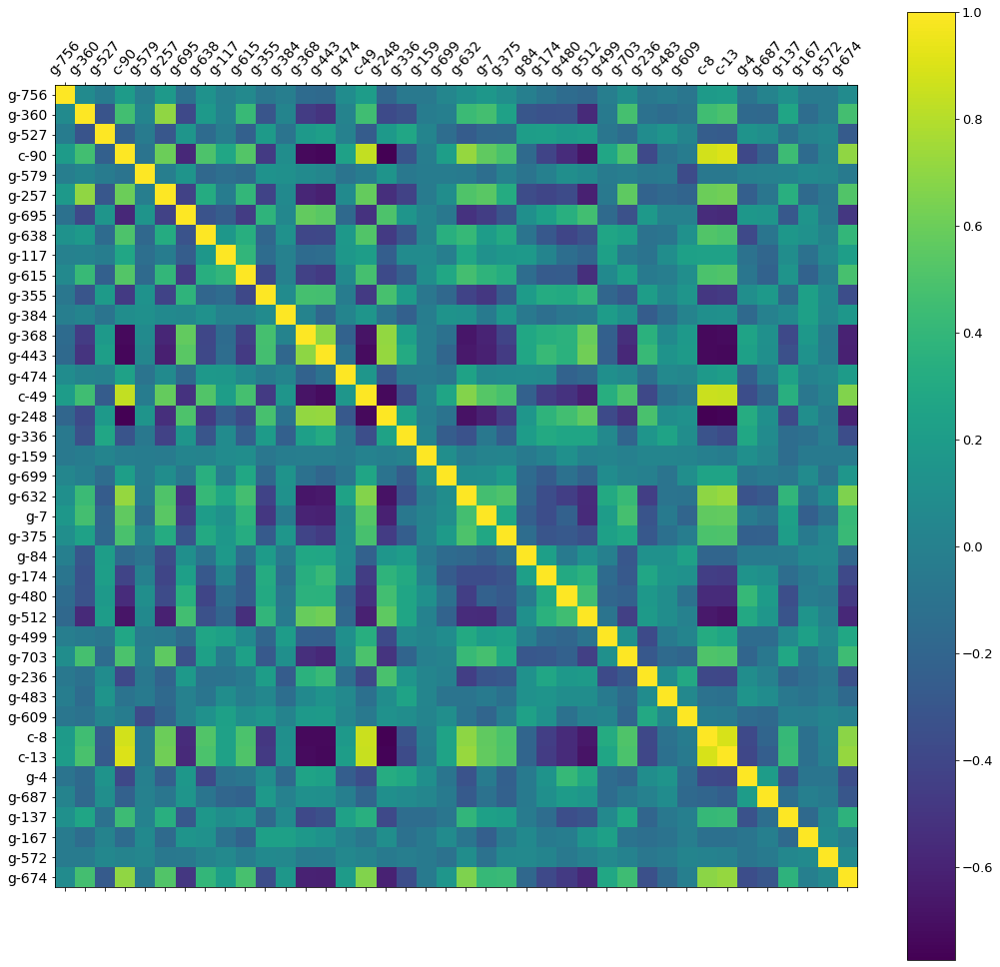

In [16]:
columns = g_list + c_list
for_correlation = list(set([columns[random.randint(0, len(columns)-1)] for i in range(200)]))[:40]
data = df[for_correlation]

f = plt.figure(figsize=(18, 17))
plt.matshow(data.corr(), fignum=f.number)
plt.xticks(range(data.shape[1]), data.columns, fontsize=14, rotation=50)
plt.yticks(range(data.shape[1]), data.columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=13)

Time to find pairs of features with high correlation.

In [17]:
start = time.time()

cols = ['cp_time'] + columns
all_columns = []
for i in range(0, len(cols)):
    for j in range(i+1, len(cols)):
        if abs(train[cols[i]].corr(train[cols[j]])) > 0.9:
            all_columns = all_columns + [cols[i], cols[j]]

print(time.time()-start)

219.44012260437012


In [18]:
all_columns = list(set(all_columns))
print('Number of columns: ', len(all_columns))

Number of columns:  35


In total we have 35 columns that have correlation with at least another 1 higher than 0.9. Let's visualize them.

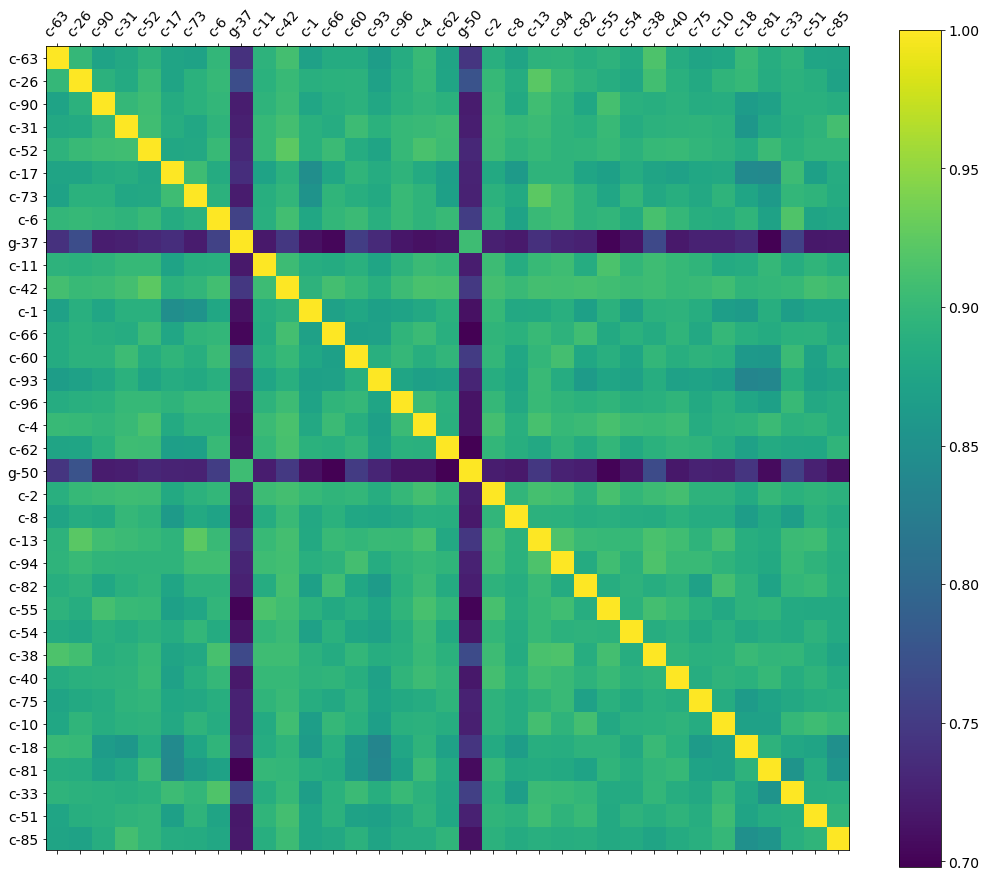

In [19]:
data = df[all_columns]

f = plt.figure(figsize=(18, 15))
plt.matshow(data.corr(), fignum=f.number)
plt.xticks(range(data.shape[1]), data.columns, fontsize=14, rotation=50)
plt.yticks(range(data.shape[1]), data.columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)

Let's visualize them.

In [20]:
fig = make_subplots(rows=12, cols=3)
traces = [go.Histogram(x=train[col], nbinsx=20, name=col) for col in all_columns]

for i in range(len(traces)):
    fig.append_trace(traces[i], (i // 3) + 1, (i % 3) + 1)

fig.update_layout(
    title_text='Highly correlated features',
    height=1200
)

fig.show()

<a id="5"></a>
<h2 style='background:blue; border:0; color:white'><center>5. Targets analysis</center><h2>

Let's check targets.

In [21]:
train_target = pd.read_csv("../input/lish-moa/train_targets_scored.csv")

print('Number of rows : ', train_target.shape[0])
print('Number of cols : ', train_target.shape[1])

train_target.head()

Number of rows :  23814
Number of cols :  207


,sig_id,5-alpha_reductase_inhibitor,11-beta-hsd1_inhibitor,acat_inhibitor,acetylcholine_receptor_agonist,acetylcholine_receptor_antagonist,acetylcholinesterase_inhibitor,adenosine_receptor_agonist,adenosine_receptor_antagonist,adenylyl_cyclase_activator,adrenergic_receptor_agonist,adrenergic_receptor_antagonist,akt_inhibitor,aldehyde_dehydrogenase_inhibitor,alk_inhibitor,ampk_activator,analgesic,androgen_receptor_agonist,androgen_receptor_antagonist,anesthetic_-_local,angiogenesis_inhibitor,angiotensin_receptor_antagonist,anti-inflammatory,antiarrhythmic,antibiotic,anticonvulsant,antifungal,antihistamine,antimalarial,antioxidant,antiprotozoal,antiviral,apoptosis_stimulant,aromatase_inhibitor,atm_kinase_inhibitor,atp-sensitive_potassium_channel_antagonist,atp_synthase_inhibitor,atpase_inhibitor,atr_kinase_inhibitor,aurora_kinase_inhibitor,autotaxin_inhibitor,bacterial_30s_ribosomal_subunit_inhibitor,bacterial_50s_ribosomal_subunit_inhibitor,bacterial_antifolate,bacterial_cell_wall_synthesis_inhibitor,bacterial_dna_gyrase_inhibitor,bacterial_dna_inhibitor,bacterial_membrane_integrity_inhibitor,bcl_inhibitor,bcr-abl_inhibitor,benzodiazepine_receptor_agonist,beta_amyloid_inhibitor,bromodomain_inhibitor,btk_inhibitor,calcineurin_inhibitor,calcium_channel_blocker,cannabinoid_receptor_agonist,cannabinoid_receptor_antagonist,carbonic_anhydrase_inhibitor,casein_kinase_inhibitor,caspase_activator,catechol_o_methyltransferase_inhibitor,cc_chemokine_receptor_antagonist,cck_receptor_antagonist,cdk_inhibitor,chelating_agent,chk_inhibitor,chloride_channel_blocker,cholesterol_inhibitor,cholinergic_receptor_antagonist,coagulation_factor_inhibitor,corticosteroid_agonist,cyclooxygenase_inhibitor,cytochrome_p450_inhibitor,dihydrofolate_reductase_inhibitor,dipeptidyl_peptidase_inhibitor,diuretic,dna_alkylating_agent,dna_inhibitor,dopamine_receptor_agonist,dopamine_receptor_antagonist,egfr_inhibitor,elastase_inhibitor,erbb2_inhibitor,estrogen_receptor_agonist,estrogen_receptor_antagonist,faah_inhibitor,farnesyltransferase_inhibitor,fatty_acid_receptor_agonist,fgfr_inhibitor,flt3_inhibitor,focal_adhesion_kinase_inhibitor,free_radical_scavenger,fungal_squalene_epoxidase_inhibitor,gaba_receptor_agonist,gaba_receptor_antagonist,gamma_secretase_inhibitor,glucocorticoid_receptor_agonist,glutamate_inhibitor,glutamate_receptor_agonist,glutamate_receptor_antagonist,gonadotropin_receptor_agonist,gsk_inhibitor,hcv_inhibitor,hdac_inhibitor,histamine_receptor_agonist,histamine_receptor_antagonist,histone_lysine_demethylase_inhibitor,histone_lysine_methyltransferase_inhibitor,hiv_inhibitor,hmgcr_inhibitor,hsp_inhibitor,igf-1_inhibitor,ikk_inhibitor,imidazoline_receptor_agonist,immunosuppressant,insulin_secretagogue,insulin_sensitizer,integrin_inhibitor,jak_inhibitor,kit_inhibitor,laxative,leukotriene_inhibitor,leukotriene_receptor_antagonist,lipase_inhibitor,lipoxygenase_inhibitor,lxr_agonist,mdm_inhibitor,mek_inhibitor,membrane_integrity_inhibitor,mineralocorticoid_receptor_antagonist,monoacylglycerol_lipase_inhibitor,monoamine_oxidase_inhibitor,monopolar_spindle_1_kinase_inhibitor,mtor_inhibitor,mucolytic_agent,neuropeptide_receptor_antagonist,nfkb_inhibitor,nicotinic_receptor_agonist,nitric_oxide_donor,nitric_oxide_production_inhibitor,nitric_oxide_synthase_inhibitor,norepinephrine_reuptake_inhibitor,nrf2_activator,opioid_receptor_agonist,opioid_receptor_antagonist,orexin_receptor_antagonist,p38_mapk_inhibitor,p-glycoprotein_inhibitor,parp_inhibitor,pdgfr_inhibitor,pdk_inhibitor,phosphodiesterase_inhibitor,phospholipase_inhibitor,pi3k_inhibitor,pkc_inhibitor,potassium_channel_activator,potassium_channel_antagonist,ppar_receptor_agonist,ppar_receptor_antagonist,progesterone_receptor_agonist,progesterone_receptor_antagonist,prostaglandin_inhibitor,prostanoid_receptor_antagonist,proteasome_inhibitor,protein_kinase_inhibitor,protein_phosphatase_inhibitor,protein_synthesis_inhibitor,protein_tyrosine_kinase_inhibitor,radiopaque_medium,raf_inhibitor,ras_gtpase_inhib

In [22]:
x = train_target.drop(['sig_id'], axis=1).sum(axis=0).sort_values().reset_index()
x.columns = ['column', 'nonzero_records']

fig = px.bar(
    x.tail(50), 
    x='nonzero_records', 
    y='column', 
    orientation='h', 
    title='Columns with the higher number of positive samples (top 50)', 
    height=1000, 
    width=800
)

fig.show()

In [23]:
x = train_target.drop(['sig_id'], axis=1).sum(axis=0).sort_values(ascending=False).reset_index()
x.columns = ['column', 'nonzero_records']

fig = px.bar(
    x.tail(50), 
    x='nonzero_records', 
    y='column', 
    orientation='h', 
    title='Columns with the lowest number of positive samples (top 50)', 
    height=1000, 
    width=800
)

fig.show()

We can see that at least 50 target columns have number pf positive samples less than 20 (about 0.1%) !!!

In [24]:
x = train_target.drop(['sig_id'], axis=1).sum(axis=0).sort_values(ascending=False).reset_index()
x.columns = ['column', 'count']
x['count'] = x['count'] * 100 / len(train_target)

fig = px.bar(
    x, 
    x='column', 
    y='count', 
    orientation='v', 
    title='Percent of positive records for every column in target', 
    height=800, 
    width=1200
)

fig.show()

The biggest number of positive samples for 1 target column is 3.5%. So we deal here with highly imbalanced data.

In [25]:
data = train_target.drop(['sig_id'], axis=1).astype(bool).sum(axis=1).reset_index()
data.columns = ['row', 'count']
data = data.groupby(['count'])['row'].count().reset_index()

fig = px.bar(
    data, 
    y=data['row'], 
    x="count", 
    title='Number of activations in targets for every sample', 
    width=800, 
    height=500
)

fig.show()

In [26]:
data = train_target.drop(['sig_id'], axis=1).astype(bool).sum(axis=1).reset_index()
data.columns = ['row', 'count']
data = data.groupby(['count'])['row'].count().reset_index()

fig = px.pie(
    data, 
    values=100 * data['row'] / len(train_target), 
    names="count", 
    title='Number of activations in targets for every sample (Percent)', 
    width=800, 
    height=500
)

fig.show()

We can see here that about 40% of sample have zeros in all columns and more than 50% have only one active target column.

In [27]:
train_target.describe()

,5-alpha_reductase_inhibitor,11-beta-hsd1_inhibitor,acat_inhibitor,acetylcholine_receptor_agonist,acetylcholine_receptor_antagonist,acetylcholinesterase_inhibitor,adenosine_receptor_agonist,adenosine_receptor_antagonist,adenylyl_cyclase_activator,adrenergic_receptor_agonist,adrenergic_receptor_antagonist,akt_inhibitor,aldehyde_dehydrogenase_inhibitor,alk_inhibitor,ampk_activator,analgesic,androgen_receptor_agonist,androgen_receptor_antagonist,anesthetic_-_local,angiogenesis_inhibitor,angiotensin_receptor_antagonist,anti-inflammatory,antiarrhythmic,antibiotic,anticonvulsant,antifungal,antihistamine,antimalarial,antioxidant,antiprotozoal,antiviral,apoptosis_stimulant,aromatase_inhibitor,atm_kinase_inhibitor,atp-sensitive_potassium_channel_antagonist,atp_synthase_inhibitor,atpase_inhibitor,atr_kinase_inhibitor,aurora_kinase_inhibitor,autotaxin_inhibitor,bacterial_30s_ribosomal_subunit_inhibitor,bacterial_50s_ribosomal_subunit_inhibitor,bacterial_antifolate,bacterial_cell_wall_synthesis_inhibitor,bacterial_dna_gyrase_inhibitor,bacterial_dna_inhibitor,bacterial_membrane_integrity_inhibitor,bcl_inhibitor,bcr-abl_inhibitor,benzodiazepine_receptor_agonist,beta_amyloid_inhibitor,bromodomain_inhibitor,btk_inhibitor,calcineurin_inhibitor,calcium_channel_blocker,cannabinoid_receptor_agonist,cannabinoid_receptor_antagonist,carbonic_anhydrase_inhibitor,casein_kinase_inhibitor,caspase_activator,catechol_o_methyltransferase_inhibitor,cc_chemokine_receptor_antagonist,cck_receptor_antagonist,cdk_inhibitor,chelating_agent,chk_inhibitor,chloride_channel_blocker,cholesterol_inhibitor,cholinergic_receptor_antagonist,coagulation_factor_inhibitor,corticosteroid_agonist,cyclooxygenase_inhibitor,cytochrome_p450_inhibitor,dihydrofolate_reductase_inhibitor,dipeptidyl_peptidase_inhibitor,diuretic,dna_alkylating_agent,dna_inhibitor,dopamine_receptor_agonist,dopamine_receptor_antagonist,egfr_inhibitor,elastase_inhibitor,erbb2_inhibitor,estrogen_receptor_agonist,estrogen_receptor_antagonist,faah_inhibitor,farnesyltransferase_inhibitor,fatty_acid_receptor_agonist,fgfr_inhibitor,flt3_inhibitor,focal_adhesion_kinase_inhibitor,free_radical_scavenger,fungal_squalene_epoxidase_inhibitor,gaba_receptor_agonist,gaba_receptor_antagonist,gamma_secretase_inhibitor,glucocorticoid_receptor_agonist,glutamate_inhibitor,glutamate_receptor_agonist,glutamate_receptor_antagonist,gonadotropin_receptor_agonist,gsk_inhibitor,hcv_inhibitor,hdac_inhibitor,histamine_receptor_agonist,histamine_receptor_antagonist,histone_lysine_demethylase_inhibitor,histone_lysine_methyltransferase_inhibitor,hiv_inhibitor,hmgcr_inhibitor,hsp_inhibitor,igf-1_inhibitor,ikk_inhibitor,imidazoline_receptor_agonist,immunosuppressant,insulin_secretagogue,insulin_sensitizer,integrin_inhibitor,jak_inhibitor,kit_inhibitor,laxative,leukotriene_inhibitor,leukotriene_receptor_antagonist,lipase_inhibitor,lipoxygenase_inhibitor,lxr_agonist,mdm_inhibitor,mek_inhibitor,membrane_integrity_inhibitor,mineralocorticoid_receptor_antagonist,monoacylglycerol_lipase_inhibitor,monoamine_oxidase_inhibitor,monopolar_spindle_1_kinase_inhibitor,mtor_inhibitor,mucolytic_agent,neuropeptide_receptor_antagonist,nfkb_inhibitor,nicotinic_receptor_agonist,nitric_oxide_donor,nitric_oxide_production_inhibitor,nitric_oxide_synthase_inhibitor,norepinephrine_reuptake_inhibitor,nrf2_activator,opioid_receptor_agonist,opioid_receptor_antagonist,orexin_receptor_antagonist,p38_mapk_inhibitor,p-glycoprotein_inhibitor,parp_inhibitor,pdgfr_inhibitor,pdk_inhibitor,phosphodiesterase_inhibitor,phospholipase_inhibitor,pi3k_inhibitor,pkc_inhibitor,potassium_channel_activator,potassium_channel_antagonist,ppar_receptor_agonist,ppar_receptor_antagonist,progesterone_receptor_agonist,progesterone_receptor_antagonist,prostaglandin_inhibitor,prostanoid_receptor_antagonist,proteasome_inhibitor,protein_kinase_inhibitor,protein_phosphatase_inhibitor,protein_synthesis_inhibitor,protein_tyrosine_kinase_inhibitor,radiopaque_medium,raf_inhibitor,ras_gtpase_inhibitor,re

<a id="6"></a>
<h2 style='background:blue; border:0; color:white'><center>6. Train & Targets correlations</center><h2>

Time to find the most correlated features for every target column.

In [28]:
start = time.time()

correlation_matrix = pd.DataFrame()

for t_col in train_target.columns:
    corr_list = list()
    if t_col == 'sig_id':
        continue
    for col in columns:
        res = train[col].corr(train_target[t_col])
        corr_list.append(res)
    correlation_matrix[t_col] = corr_list
    
print(time.time()-start)

107.09790515899658


And we have large correlation matrix.

In [29]:
correlation_matrix['train_features'] = columns
correlation_matrix = correlation_matrix.set_index('train_features')

correlation_matrix

,5-alpha_reductase_inhibitor,11-beta-hsd1_inhibitor,acat_inhibitor,acetylcholine_receptor_agonist,acetylcholine_receptor_antagonist,acetylcholinesterase_inhibitor,adenosine_receptor_agonist,adenosine_receptor_antagonist,adenylyl_cyclase_activator,adrenergic_receptor_agonist,adrenergic_receptor_antagonist,akt_inhibitor,aldehyde_dehydrogenase_inhibitor,alk_inhibitor,ampk_activator,analgesic,androgen_receptor_agonist,androgen_receptor_antagonist,anesthetic_-_local,angiogenesis_inhibitor,angiotensin_receptor_antagonist,anti-inflammatory,antiarrhythmic,antibiotic,anticonvulsant,antifungal,antihistamine,antimalarial,antioxidant,antiprotozoal,antiviral,apoptosis_stimulant,aromatase_inhibitor,atm_kinase_inhibitor,atp-sensitive_potassium_channel_antagonist,atp_synthase_inhibitor,atpase_inhibitor,atr_kinase_inhibitor,aurora_kinase_inhibitor,autotaxin_inhibitor,bacterial_30s_ribosomal_subunit_inhibitor,bacterial_50s_ribosomal_subunit_inhibitor,bacterial_antifolate,bacterial_cell_wall_synthesis_inhibitor,bacterial_dna_gyrase_inhibitor,bacterial_dna_inhibitor,bacterial_membrane_integrity_inhibitor,bcl_inhibitor,bcr-abl_inhibitor,benzodiazepine_receptor_agonist,beta_amyloid_inhibitor,bromodomain_inhibitor,btk_inhibitor,calcineurin_inhibitor,calcium_channel_blocker,cannabinoid_receptor_agonist,cannabinoid_receptor_antagonist,carbonic_anhydrase_inhibitor,casein_kinase_inhibitor,caspase_activator,catechol_o_methyltransferase_inhibitor,cc_chemokine_receptor_antagonist,cck_receptor_antagonist,cdk_inhibitor,chelating_agent,chk_inhibitor,chloride_channel_blocker,cholesterol_inhibitor,cholinergic_receptor_antagonist,coagulation_factor_inhibitor,corticosteroid_agonist,cyclooxygenase_inhibitor,cytochrome_p450_inhibitor,dihydrofolate_reductase_inhibitor,dipeptidyl_peptidase_inhibitor,diuretic,dna_alkylating_agent,dna_inhibitor,dopamine_receptor_agonist,dopamine_receptor_antagonist,egfr_inhibitor,elastase_inhibitor,erbb2_inhibitor,estrogen_receptor_agonist,estrogen_receptor_antagonist,faah_inhibitor,farnesyltransferase_inhibitor,fatty_acid_receptor_agonist,fgfr_inhibitor,flt3_inhibitor,focal_adhesion_kinase_inhibitor,free_radical_scavenger,fungal_squalene_epoxidase_inhibitor,gaba_receptor_agonist,gaba_receptor_antagonist,gamma_secretase_inhibitor,glucocorticoid_receptor_agonist,glutamate_inhibitor,glutamate_receptor_agonist,glutamate_receptor_antagonist,gonadotropin_receptor_agonist,gsk_inhibitor,hcv_inhibitor,hdac_inhibitor,histamine_receptor_agonist,histamine_receptor_antagonist,histone_lysine_demethylase_inhibitor,histone_lysine_methyltransferase_inhibitor,hiv_inhibitor,hmgcr_inhibitor,hsp_inhibitor,igf-1_inhibitor,ikk_inhibitor,imidazoline_receptor_agonist,immunosuppressant,insulin_secretagogue,insulin_sensitizer,integrin_inhibitor,jak_inhibitor,kit_inhibitor,laxative,leukotriene_inhibitor,leukotriene_receptor_antagonist,lipase_inhibitor,lipoxygenase_inhibitor,lxr_agonist,mdm_inhibitor,mek_inhibitor,membrane_integrity_inhibitor,mineralocorticoid_receptor_antagonist,monoacylglycerol_lipase_inhibitor,monoamine_oxidase_inhibitor,monopolar_spindle_1_kinase_inhibitor,mtor_inhibitor,mucolytic_agent,neuropeptide_receptor_antagonist,nfkb_inhibitor,nicotinic_receptor_agonist,nitric_oxide_donor,nitric_oxide_production_inhibitor,nitric_oxide_synthase_inhibitor,norepinephrine_reuptake_inhibitor,nrf2_activator,opioid_receptor_agonist,opioid_receptor_antagonist,orexin_receptor_antagonist,p38_mapk_inhibitor,p-glycoprotein_inhibitor,parp_inhibitor,pdgfr_inhibitor,pdk_inhibitor,phosphodiesterase_inhibitor,phospholipase_inhibitor,pi3k_inhibitor,pkc_inhibitor,potassium_channel_activator,potassium_channel_antagonist,ppar_receptor_agonist,ppar_receptor_antagonist,progesterone_receptor_agonist,progesterone_receptor_antagonist,prostaglandin_inhibitor,prostanoid_receptor_antagonist,proteasome_inhibitor,protein_kinase_inhibitor,protein_phosphatase_inhibitor,protein_synthesis_inhibitor,protein_tyrosine_kinase_inhibitor,radiopaque_medium,raf_inhibitor,ras_gtpase_inhibitor,re

Let's see what is the higher value (absolute) of correlation for target columns with every column from train set. Every column on chart is max correlation of current target column with all of columns from training set.

In [30]:
maxCol=lambda x: max(x.min(), x.max(), key=abs)
high_scores = correlation_matrix.apply(maxCol, axis=0).reset_index()
high_scores.columns = ['column', 'best_correlation']

fig = px.bar(
    high_scores, 
    x='column', 
    y="best_correlation", 
    orientation='v', 
    title='Best correlation with train columns for every target column', 
    width=1200,
    height=800
)

fig.show()

Now let's see what columns from training set have the higher number of "high" correlations with target columns. Every row from chart means that column `A` `N` times has the best value of correlation with different target columns. 

In [31]:
col_df = pd.DataFrame()
tr_cols = list()
tar_cols = list()

for col in correlation_matrix.columns:
    tar_cols.append(col)
    tr_cols.append(correlation_matrix[col].abs().sort_values(ascending=False).reset_index()['train_features'].head(1).values[0])

col_df['column'] = tar_cols
col_df['train_best_column'] = tr_cols

total_scores = pd.merge(high_scores, col_df)
total_scores

,column,best_correlation,train_best_column
0,5-alpha_reductase_inhibitor,-0.028704,g-211
1,11-beta-hsd1_inhibitor,-0.018517,g-571
2,acat_inhibitor,-0.018810,g-350
3,acetylcholine_receptor_agonist,-0.033727,g-91
4,acetylcholine_receptor_antagonist,-0.042654,g-392
...,...,...,...
201,ubiquitin_specific_protease_inhibitor,0.017409,g-18
202,vegfr_inhibitor,-0.082568,c-98
203,vitamin_b,-0.027648,g-356
204,vitamin_d_receptor_agonist,0.054114,g-627


In [32]:
count_features = total_scores['train_best_column'].value_counts().reset_index().sort_values('train_best_column')
count_features.columns = ['column', 'count']
fig = px.bar(
    count_features.tail(33), 
    x='count', 
    y="column", 
    orientation='h', 
    title='Columns from training set with number of high correlations with target columns', 
    width=800,
    height=700
)

fig.show()

Target columns and pairs of highly correlated features.

Let's select some random columns and see how they deal with pairs of the highly correlated features.

In [33]:
target_columns = train_target.columns.tolist()
target_columns.remove('sig_id')
for_analysis = [target_columns[random.randint(0, len(target_columns)-1)] for i in range(5)]
current_corr = correlation_matrix[for_analysis]

In [34]:
col_df = pd.DataFrame()
tr_first_cols = list()
tr_second_cols = list()
tar_cols = list()
for col in current_corr.columns:
    tar_cols.append(col)
    tr_first_cols.append(current_corr[col].abs().sort_values(ascending=False).reset_index()['train_features'].head(2).values[0])
    tr_second_cols.append(current_corr[col].abs().sort_values(ascending=False).reset_index()['train_features'].head(2).values[1])

col_df['column'] = tar_cols
col_df['train_1_column'] = tr_first_cols
col_df['train_2_column'] = tr_second_cols
col_df

,column,train_1_column,train_2_column
0,igf-1_inhibitor,g-628,g-117
1,flt3_inhibitor,g-157,c-65
2,nfkb_inhibitor,c-78,c-32
3,mineralocorticoid_receptor_antagonist,g-463,g-82
4,tachykinin_antagonist,g-140,g-386


In [35]:
def plot_scatter(col_df, index):
    analysis = pd.DataFrame()
    analysis['color'] = train_target[col_df.iloc[index]['column']]
    analysis['x'] = train[col_df.iloc[index]['train_1_column']]
    analysis['y'] = train[col_df.iloc[index]['train_2_column']]
    analysis.columns = ['color', col_df.iloc[index]['train_1_column'], col_df.iloc[index]['train_2_column']]
    analysis['size'] = 1
    analysis.loc[analysis['color'] == 1, 'size'] = 10

    fig = px.scatter(
        analysis, 
        x=col_df.iloc[index]['train_1_column'], 
        y=col_df.iloc[index]['train_2_column'], 
        color="color", 
        size='size', 
        height=600,
        width=600,
        title='Scatter plot for ' + col_df.iloc[index]['column']
    )
    fig.show()

In [36]:
plot_scatter(col_df, 0)

In [37]:
plot_scatter(col_df, 1)

In [38]:
plot_scatter(col_df, 2)

In [39]:
plot_scatter(col_df, 3)

In [40]:
plot_scatter(col_df, 4)

Let's do the same but for 3d plots.

In [41]:
for_analysis = [target_columns[random.randint(0, len(target_columns)-1)] for i in range(5)]
current_corr = correlation_matrix[for_analysis]

col_df = pd.DataFrame()
tr_first_cols = list()
tr_second_cols = list()
tr_third_cols = list()
tar_cols = list()

for col in current_corr.columns:
    tar_cols.append(col)
    tr_first_cols.append(current_corr[col].abs().sort_values(ascending=False).reset_index()['train_features'].head(3).values[0])
    tr_second_cols.append(current_corr[col].abs().sort_values(ascending=False).reset_index()['train_features'].head(3).values[1])
    tr_third_cols.append(current_corr[col].abs().sort_values(ascending=False).reset_index()['train_features'].head(3).values[2])

col_df['column'] = tar_cols
col_df['train_1_column'] = tr_first_cols
col_df['train_2_column'] = tr_second_cols
col_df['train_3_column'] = tr_third_cols

col_df

,column,train_1_column,train_2_column,train_3_column
0,nitric_oxide_donor,g-610,g-586,g-673
1,antiviral,g-15,g-703,g-140
2,bacterial_dna_gyrase_inhibitor,g-628,g-432,g-534
3,protein_kinase_inhibitor,g-769,g-330,g-253
4,bcr-abl_inhibitor,g-22,g-635,g-84


In [42]:
def plot_3dscatter(col_df, index):
    analysis = pd.DataFrame()
    analysis['color'] = train_target[col_df.iloc[index]['column']]
    analysis['x'] = train[col_df.iloc[index]['train_1_column']]
    analysis['y'] = train[col_df.iloc[index]['train_2_column']]
    analysis['z'] = train[col_df.iloc[index]['train_3_column']]
    analysis.columns = ['color', col_df.iloc[index]['train_1_column'], col_df.iloc[index]['train_2_column'], col_df.iloc[index]['train_3_column']]
    analysis['size'] = 1
    analysis.loc[analysis['color'] == 1, 'size'] = 20

    fig = px.scatter_3d(
        analysis, 
        x=col_df.iloc[index]['train_1_column'], 
        y=col_df.iloc[index]['train_2_column'],
        z=col_df.iloc[index]['train_3_column'], 
        color="color", 
        size='size', 
        height=600,
        width=600,
        title='Scatter plot for ' + col_df.iloc[index]['column']
    )
    fig.show()

In [43]:
plot_3dscatter(col_df, 0)

In [44]:
plot_3dscatter(col_df, 1)

In [45]:
plot_3dscatter(col_df, 2)

In [46]:
plot_3dscatter(col_df, 3)

In [47]:
plot_3dscatter(col_df, 4)

We can extract several group names from target column names. Looks like that last term in column name is definition of a group. Let's extact them and visualize groups with number of columns > 1.

In [48]:
last_term = dict()

for item in target_columns:
    try:
        last_term[item.split('_')[-1]] += 1
    except:
        last_term[item.split('_')[-1]] = 1

last_term = pd.DataFrame(last_term.items(), columns=['group', 'count'])
last_term = last_term.sort_values('count')
last_term = last_term[last_term['count']>1]
last_term['count'] = last_term['count'] * 100 / 206

fig = px.bar(
    last_term, 
    x='count', 
    y="group", 
    orientation='h', 
    title='Groups in target columns (Percent from all target columns)', 
    width=800,
    height=500
)

fig.show()

Is it possible to have more than 1 activation for 1 sample in every group?

In [49]:
answer = list()
for group in last_term.group.tolist():
    agent_list = list()
    for item in target_columns:
        if item.split('_')[-1] == group:
            agent_list.append(item)
    agent_df = train_target[agent_list]
    data = agent_df.astype(bool).sum(axis=1).reset_index()
    answer.append(data[0].max())

In [50]:
ds = pd.DataFrame()
ds['group'] = last_term.group.tolist()
ds['max_value'] = answer

fig = px.bar(
    ds, 
    x='max_value', 
    y="group", 
    orientation='h', 
    title='Maximum number of active columns in 1 sample for every group', 
    width=800,
    height=500
)

fig.show()

We can see that for groups activator, agent, blocker maximum number of active columns in sample is 1.

<a id="7"></a>
<h2 style='background:blue; border:0; color:white'><center>7. Targets & Train features dependecies</center><h2>

Let's check target columns with categorical columns from training set.

In [51]:
categories = train[['cp_type', 'cp_time', 'cp_dose']]
tar = train_target.copy()
tar = tar.drop(['sig_id'], axis=1)
analysis = pd.concat([categories, tar], axis=1)

In [52]:
for category in analysis['cp_dose'].unique().tolist():
    number = 0
    cols = []
    for col in analysis.columns:
        if col in ['cp_type', 'cp_time', 'cp_dose']:
            continue
        if len(analysis[analysis['cp_dose'] == category][col].value_counts()) == 1:
            number += 1
            cols.append(col)

    print(category, '. Number of columns with 1 unique value: ', number, '. Columns: ', cols)

D1 . Number of columns with 1 unique value:  0 . Columns:  []
D2 . Number of columns with 1 unique value:  2 . Columns:  ['atp-sensitive_potassium_channel_antagonist', 'erbb2_inhibitor']


Let's check problematic columns for dp_dose = 2.

In [53]:
analysis[analysis['cp_dose'] == 'D2']['atp-sensitive_potassium_channel_antagonist'].value_counts()

0    11667
Name: atp-sensitive_potassium_channel_antagonist, dtype: int64

In [54]:
analysis[analysis['cp_dose']=='D2']['erbb2_inhibitor'].value_counts()

0    11667
Name: erbb2_inhibitor, dtype: int64

In [55]:
for category in analysis['cp_time'].unique().tolist():
    number = 0
    cols = []
    for col in analysis.columns:
        if col in ['cp_type', 'cp_time', 'cp_dose']:
            continue
        if len(analysis[analysis['cp_time']==category][col].value_counts()) == 1:
            number += 1
            cols.append(col)

    print(category, '. Number of columns with 1 unique value: ', number, '. Columns: ', cols)

24 . Number of columns with 1 unique value:  2 . Columns:  ['atp-sensitive_potassium_channel_antagonist', 'erbb2_inhibitor']
72 . Number of columns with 1 unique value:  2 . Columns:  ['atp-sensitive_potassium_channel_antagonist', 'erbb2_inhibitor']
48 . Number of columns with 1 unique value:  0 . Columns:  []


Let's check problematic columns for cp_time = 24 and 72.

In [56]:
analysis[analysis['cp_time'] == 24]['erbb2_inhibitor'].value_counts()

0    7772
Name: erbb2_inhibitor, dtype: int64

In [57]:
analysis[analysis['cp_time'] == 72]['erbb2_inhibitor'].value_counts()

0    7792
Name: erbb2_inhibitor, dtype: int64

In [58]:
analysis[analysis['cp_time'] == 24]['atp-sensitive_potassium_channel_antagonist'].value_counts()

0    7772
Name: atp-sensitive_potassium_channel_antagonist, dtype: int64

In [59]:
analysis[analysis['cp_time'] == 72]['atp-sensitive_potassium_channel_antagonist'].value_counts()

0    7792
Name: atp-sensitive_potassium_channel_antagonist, dtype: int64

In [60]:
for category in analysis['cp_type'].unique().tolist():
    number = 0
    cols = []
    for col in analysis.columns:
        if col in ['cp_type', 'cp_time', 'cp_dose']:
            continue
        if len(analysis[analysis['cp_type']==category][col].value_counts()) == 1:
            number += 1
            cols.append(col)

    print(category, '. Number of columns with 1 unique value: ', number, '. Columns: ', cols)

trt_cp . Number of columns with 1 unique value:  0 . Columns:  []
ctl_vehicle . Number of columns with 1 unique value:  206 . Columns:  ['5-alpha_reductase_inhibitor', '11-beta-hsd1_inhibitor', 'acat_inhibitor', 'acetylcholine_receptor_agonist', 'acetylcholine_receptor_antagonist', 'acetylcholinesterase_inhibitor', 'adenosine_receptor_agonist', 'adenosine_receptor_antagonist', 'adenylyl_cyclase_activator', 'adrenergic_receptor_agonist', 'adrenergic_receptor_antagonist', 'akt_inhibitor', 'aldehyde_dehydrogenase_inhibitor', 'alk_inhibitor', 'ampk_activator', 'analgesic', 'androgen_receptor_agonist', 'androgen_receptor_antagonist', 'anesthetic_-_local', 'angiogenesis_inhibitor', 'angiotensin_receptor_antagonist', 'anti-inflammatory', 'antiarrhythmic', 'antibiotic', 'anticonvulsant', 'antifungal', 'antihistamine', 'antimalarial', 'antioxidant', 'antiprotozoal', 'antiviral', 'apoptosis_stimulant', 'aromatase_inhibitor', 'atm_kinase_inhibitor', 'atp-sensitive_potassium_channel_antagonist', '

In [61]:
analysis[analysis['cp_type']=='ctl_vehicle']['igf-1_inhibitor'].value_counts()

0    1866
Name: igf-1_inhibitor, dtype: int64

We can see that for column ```cp_type``` all records where value is ```ctl_vehicle``` for all targets are 0. The same picture for ```cp_time``` == 72 ana == 24, but only for 2 target columns and for ```cp_dose``` == D2 also for 2 target columns.
